In [4]:
import os
import numpy as np
import sys
import numpy
import pandas as pd
import pandasql
from sklearn.cluster import KMeans
from datetime import datetime, timedelta
import seaborn as sns
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.tree import DecisionTreeRegressor  
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error

loan = pd.read_csv(r"C:\Users\chudi\Desktop\Marketing_Analytics_Challenge\Creation_Files\loan.csv", na_values=[""])
marketing = pd.read_csv(r"C:\Users\chudi\Desktop\Marketing_Analytics_Challenge\Creation_Files\marketing.csv", na_values=[""])
merchant = pd.read_csv(r"C:\Users\chudi\Desktop\Marketing_Analytics_Challenge\Creation_Files\merchant.csv", na_values=[""])
funnel = pd.read_csv(r"C:\Users\chudi\Desktop\Marketing_Analytics_Challenge\Creation_Files\funnel_(4).csv", na_values=[""])

In [5]:
#Left Join merchant and loan table to understand merchant performance
merchant_performance = merchant.merge(loan,how='left',left_on='merchant_id',right_on='merchant_id')
merchant_performance

,merchant_id,name,industry,tos,checkout_id,checkout_date,user_id,loan_amount,loan_length,fico_tranche,loan_return
0,OJ2KOSPYHD4VKPK5,Corgi,Jewelry,2100000,7691095.0,12/28/17,1187-5086-VYXX,984.0,12.0,b) Prime,157.510620
1,OJ2KOSPYHD4VKPK5,Corgi,Jewelry,2100000,5230436.0,8/19/17,9249-0935-WIPH,935.0,12.0,b) Prime,82.554588
2,OJ2KOSPYHD4VKPK5,Corgi,Jewelry,2100000,6160670.0,10/16/17,2834-6677-KBXZ,437.0,3.0,d) Subprime,35.969491
3,OJ2KOSPYHD4VKPK5,Corgi,Jewelry,2100000,6899987.0,11/24/17,3402-7830-MMVN,593.0,12.0,c) Near Prime,89.908810
4,OJ2KOSPYHD4VKPK5,Corgi,Jewelry,2100000,7647427.0,12/26/17,4323-6320-ENDJ,929.0,NaN,a) Superprime,NaN
...,...,...,...,...,...,...,...,...,...,...,...
103598,HVLW5SXM9GIHLJ7V,Pomeranian,Sporting Goods and Outdoors,3600000,5173899.0,8/15/17,1563-3911-PWXI,373.0,12.0,b) Prime,22.120628
103599,HVLW5SXM9GIHLJ7V,Pomeranian,Sporting Goods and Outdoors,3600000,6339409.0,10/27/17,5145-8592-FNQU,499.0,12.0,d) Subprime,35.566225
103600,HVLW5SXM9GIHLJ7V,Pomeranian,Sporting Goods and Outdoors,3600000,6762168.0,11/20/17,9241-7490-GJTE,779.0,12.0,c) Near Prime,65.636692
103601,HVLW5SXM9GIHLJ7V,Pomeranian,Sporting Goods and Outdoors,3600000,5287009.0,8/22/17,8689-9100-QXXP,430.0,6.0,c) Near Prime,15.968517


In [6]:
# Finding application approval rate
approval_rate = funnel.approved.sum()/funnel.application.sum()
approval_rate

0.5971486994461473

In [7]:
# Finding confirmed booking rate
booking_rate = funnel.confirmed.sum()/funnel.approved.sum()
booking_rate

0.6920537496240807

In [8]:
# Finding industries with the highest average loan returns
industry = merchant_performance.groupby('industry').mean().drop(['checkout_id','loan_length'],axis=1)
industry = industry['loan_return'] 
industry

industry
Apparel                        23.727885
Furniture / Homewares          81.030826
Jewelry                        75.534206
Sporting Goods and Outdoors    97.794044
Name: loan_return, dtype: float64

In [9]:
# Merchants with the highest average loan return and highest average tos
name_merchant = merchant_performance.groupby('name').mean().drop(['checkout_id','loan_length'],axis=1)
name_merchant

,tos,loan_amount,loan_return
name,,,
Beagle,100000000,702.406614,36.942846
Boston Terrier,4000000,5875.000000,304.804500
Boxer,12000000,1625.503226,198.388539
Corgi,2100000,498.963810,63.555673
Dachshund,5000000,790.536723,49.320713
Doberman,10000000,834.260700,51.420541
French Bulldog,2100000,570.425082,25.787838
German Shepherd,39060000,1077.155120,94.296037
Great Dane,6300000,1453.626263,123.008585


In [10]:
# Finding users creditworthiness that led to the highest average loan return
fico = merchant_performance.groupby('fico_tranche').mean().drop(['checkout_id','loan_length'],axis=1)
fico

,tos,loan_amount,loan_return
fico_tranche,,,
a) Superprime,3.151565e+07,1189.236702,60.285489
b) Prime,2.841638e+07,957.569520,54.738723
c) Near Prime,2.785782e+07,698.463988,44.063300
d) Subprime,2.928235e+07,605.088172,42.149942
e) Deep Subprime,2.785104e+07,350.213080,33.180410
f) Developing Credit,3.437252e+07,775.104339,70.892608


In [11]:
# Fico return averages by industry
fico_rates = merchant_performance.groupby(['industry','fico_tranche'], as_index=False).mean().drop('checkout_id',axis=1)
fico_rates

,industry,fico_tranche,tos,loan_amount,loan_length,loan_return
0,Apparel,a) Superprime,1.668598e+07,726.033440,8.511184,26.831410
1,Apparel,b) Prime,1.588381e+07,660.915901,8.977753,34.022675
2,Apparel,c) Near Prime,1.702348e+07,470.953198,9.081807,22.806438
3,Apparel,d) Subprime,1.946478e+07,336.236144,8.658176,7.952954
4,Apparel,e) Deep Subprime,1.695049e+07,236.368173,8.377760,0.322156
5,Apparel,f) Developing Credit,2.676457e+07,308.685714,8.093023,3.050925
6,Furniture / Homewares,a) Superprime,3.584565e+07,1359.827520,6.930574,66.172371
7,Furniture / Homewares,b) Prime,3.559061e+07,1302.338364,7.047133,74.862947
8,Furniture / Homewares,c) Near Prime,3.532226e+07,1221.586186,7.452530,85.858659
9,Furniture / Homewares,d) Subprime,3.561540e+07,1106.657686,8.285928,97.050933


In [12]:
# LEFT JOINing funnel and merchant to to find confirmed booking rates and approval rates by industry
merchant_performance_rates = pd.DataFrame(pandasql.sqldf("SELECT * FROM funnel LEFT JOIN merchant ON funnel.merchant_id=merchant.merchant_id", locals()))
industry_rates = merchant_performance_rates.groupby('industry').sum().drop('checkout_id',axis=1)
industry_rates['approval_rate'] = industry_rates.approved/industry_rates.application
industry_rates['booking_rate'] = industry_rates.confirmed/industry_rates.approved
industry_rates

,application,approved,confirmed,tos,approval_rate,booking_rate
industry,,,,,,
Apparel,113476.0,70092.0,52298.0,2.170909e+12,0.617681,0.746134
Furniture / Homewares,75442.0,48550.0,31215.0,3.226731e+12,0.643541,0.642945
Jewelry,45948.0,22242.0,14437.0,2.397122e+12,0.484069,0.649087
Sporting Goods and Outdoors,10145.0,5424.0,3303.0,8.164550e+10,0.534648,0.608960


In [13]:
# Finding confirmed booking rates and approval rates by merchant (seems to be a positive correlation between loan amount and loan return amongst merchants)
name_rates = merchant_performance_rates.groupby('name').sum().drop('checkout_id',axis=1)
name_rates['approval_rate'] = name_rates.approved/name_rates.application
name_rates['booking_rate'] = name_rates.confirmed/name_rates.approved
name_rates

,application,approved,confirmed,tos,approval_rate,booking_rate
name,,,,,,
Beagle,6330.0,3516.0,2598.0,7.245000e+11,0.555450,0.738908
Boston Terrier,20.0,10.0,2.0,1.120000e+08,0.500000,0.200000
Boxer,234.0,182.0,153.0,3.072000e+09,0.777778,0.840659
Corgi,8632.0,3150.0,2351.0,2.308530e+10,0.364921,0.746349
Dachshund,485.0,264.0,175.0,3.035000e+09,0.544330,0.662879
Doberman,1747.0,761.0,507.0,3.231000e+10,0.435604,0.666229
French Bulldog,91079.0,56599.0,41832.0,2.134986e+11,0.621428,0.739094
German Shepherd,8821.0,4782.0,3178.0,4.276289e+11,0.542115,0.664575
Great Dane,4681.0,2352.0,1142.0,4.671450e+10,0.502457,0.485544


In [14]:
# Calculating repeat purchase rate
repeat_customer = merchant_performance_rates.groupby('user_id').sum()
total_purchasers = repeat_customer.loc[repeat_customer['confirmed'] > 0]
repeat_purchasers = total_purchasers.loc[total_purchasers['confirmed'] > 1]
repeat_purchase_rate = repeat_purchasers.confirmed.count()/total_purchasers.confirmed.count()
repeat_purchase_rate

0.19744073385531868

In [15]:
funnel2 = funnel.loc[funnel.application.isna() == False]
funnel2.groupby('user_id',as_index=False)
funnel2.user_id.nunique()

168867

In [16]:
# Finding industries that average highest repeating customers by merging repeat purchasers with user_industry table
user_industry = pd.DataFrame(pandasql.sqldf("SELECT user_id, industry FROM merchant_performance_rates GROUP BY user_id", locals()))
user_industry_with_repeat_purchasers = pd.DataFrame(pandasql.sqldf("SELECT user_industry.user_id,repeat_purchasers.confirmed as average_repeat_purchases, user_industry.industry FROM repeat_purchasers INNER JOIN user_industry ON repeat_purchasers.user_id=user_industry.user_id", locals()))
average_repeats_by_industry = user_industry_with_repeat_purchasers.groupby('industry').mean()
average_repeats_by_industry

,average_repeat_purchases
industry,
Apparel,3.058698
Furniture / Homewares,2.139154
Jewelry,2.625965
Sporting Goods and Outdoors,2.221649


In [17]:
# Finding merchants that average highest repeating customers by merging repeat purchasers with user_merchant_name table
user_merchant_name = pd.DataFrame(pandasql.sqldf("SELECT user_id, name FROM merchant_performance_rates GROUP BY user_id", locals()))
user_merchant_name_with_repeat_purchasers = pd.DataFrame(pandasql.sqldf("SELECT user_merchant_name.user_id,repeat_purchasers.confirmed as average_repeat_purchases, user_merchant_name.name FROM repeat_purchasers INNER JOIN user_merchant_name ON repeat_purchasers.user_id=user_merchant_name.user_id", locals()))
average_repeats_by_merchant = user_merchant_name_with_repeat_purchasers.groupby('name').mean()
average_repeats_by_merchant

,average_repeat_purchases
name,
Beagle,2.673820
Boxer,2.266667
Corgi,2.576119
Dachshund,2.576923
Doberman,2.205128
French Bulldog,3.108479
German Shepherd,2.106667
Great Dane,2.047619
Husky,2.083333


In [18]:
# Removing duplicate merchant column
merchant_performance_rates = merchant_performance_rates.loc[:,~merchant_performance_rates.columns.duplicated()]


In [19]:
# Finding out which marketing channel had the highest number of applications as well as the best application approval rates
marketing_effect = merchant_performance_rates.merge(marketing, how='left', left_on='user_id', right_on='user_id')
marketing_effect = marketing_effect.loc[(marketing_effect['application'] == 1) & (marketing_effect['last_touch_marketing_channel'].isna() == False)]
marketing_effect_rates = marketing_effect.groupby('last_touch_marketing_channel').sum()
marketing_effect_rates['approval_rate'] = marketing_effect_rates.approved/marketing_effect_rates.application
marketing_effect_rates['booking_rate'] = marketing_effect_rates.confirmed/marketing_effect_rates.approved
marketing_effect_rates = marketing_effect_rates[['application','confirmed','approval_rate','booking_rate']]
marketing_effect_rates


,application,confirmed,approval_rate,booking_rate
last_touch_marketing_channel,,,,
Direct Load,24109.0,11184.0,0.695964,0.666547
Display,7026.0,3222.0,0.717763,0.638905
Email,27107.0,12100.0,0.678164,0.658217
Organic Search,33567.0,15243.0,0.684452,0.663460
Paid Social,11098.0,4861.0,0.676608,0.647357
Push,8190.0,3664.0,0.648962,0.689370


In [20]:
#Finding which marketing channel returned the most profits
marketing_and_loan = marketing.merge(loan,how='inner',left_on='user_id',right_on='user_id')
marketing_profit_yield = marketing_and_loan.groupby('last_touch_marketing_channel').mean()['loan_return']
marketing_profit_yield


last_touch_marketing_channel
Direct Load       30.252713
Display           26.276871
Email             30.757820
Organic Search    31.684389
Paid Social       31.932428
Push              44.482653
Name: loan_return, dtype: float64

In [21]:
#Finding most effective marketing channel by industry
marketing_loan_merchant = marketing_and_loan.merge(merchant,how='inner',on='merchant_id')
profit_by_channel_by_industry = marketing_loan_merchant.groupby(['industry','last_touch_marketing_channel'], as_index=False).mean()
profit_by_channel_by_industry = profit_by_channel_by_industry[['industry','last_touch_marketing_channel','loan_return']]
profit_by_channel_by_industry

,industry,last_touch_marketing_channel,loan_return
0,Apparel,Direct Load,21.221345
1,Apparel,Display,20.658360
2,Apparel,Email,19.675321
3,Apparel,Organic Search,21.249686
4,Apparel,Paid Social,21.695837
5,Apparel,Push,27.091369
6,Furniture / Homewares,Direct Load,65.675966
7,Furniture / Homewares,Display,66.885370
8,Furniture / Homewares,Email,73.543756
9,Furniture / Homewares,Organic Search,68.398775


In [22]:

marketing_loan_merchant.date = pd.to_datetime(marketing_loan_merchant.date)
marketing_loan_merchant.checkout_date = pd.to_datetime(marketing_loan_merchant.checkout_date)

date = marketing_loan_merchant.loc[marketing_loan_merchant['checkout_date'] >= marketing_loan_merchant['date']]

print(date.date.min())

2017-06-18 00:00:00


In [23]:
# Creating interesting groups for analysis
fico_industry_grp = marketing_loan_merchant.groupby(by=['fico_tranche','industry'], axis=0,as_index=False)
name_and_industry_grp = marketing_loan_merchant.groupby(by=['industry','name'])

# Creating function to see how much outliers affect profitability
def truncated_mean(data):
    '''Compute mean and exclude outliers'''
    top_value = data.quantile(.9)
    bot_value = data.quantile(.1)
    trunc_data = data[(data <= top_value) & (data >= bot_value)]
    mean = trunc_data.mean()
    return(mean)


In [24]:
# We can see that subprime loan returns for the Jewelry industry were affected significantly by outliers
fico_industry_grp.agg({'loan_return':[truncated_mean,'mean','median','std']})

c) Near Prime  Sporting Goods and Outdoors      54.108240   
12           d) Subprime                      Apparel       4.268201   
13           d) Subprime        Furniture / Homewares      83.658463   
14           d) Subprime                      Jewelry      26.206657   
15           d) Subprime  Sporting Goods and Outdoors      18.497938   
16      e) Deep Subprime                      Apparel      -1.441969   
17      e) Deep Subprime        Furniture / Homewares      77.210041   
18      e) Deep Subprime                      Jewelry      20.958154   
19      e) Deep Subprime  Sporting Goods and Outdoors       8.535161   
20  f) Developing Credit                      Apparel       2.683950   
21  f) Developing Credit        Furniture / Homewares      78.965663   
22  f) Developing Credit                      Jewelry      41.172337   
23  f) Developing Credit  Sporting Goods and Outdoors      12.743967   

                                        
          mean      median         std  
0    24.544372   11.790927   47.082625  
1    55.826547   43.988448   77.482621  
2    75.189702   29.337978  120.577836  
3   120.419958  120.339708   98.258794  
4    31.106040   14.873500   54.071507  
5    58.454984   46.023694   81.945644  
6    80.828843   31.375835  137.851378  
7    78.149413   53.878298   79.009306  
8    20.806297   11.212607   33.004064  
9    65.389616   51.773813   75.548570  
10   50.079924   21.533717   76.067369  
11   60.947889   45.227875   63.622047  
12    6.680734    2.450685   17.302197  
13   85.283534   99.732480   77.311281  
14   41.101036   14.245550   66.153493  
15   23.224933   10.866265   42.282846  
16   -0.143764   -2.419878   10.503463  
17   78.973013   90.139000   70.481120  
18   34.524750    7.969234   63.461752  
19   16.778510    5.729005   31.884805  
20    4.898016    0.376952   14.657903  
21   75.307399   91.676000   70.758764  
22   54.117515   18.544162   72.861237  
23   14.731913    9.561452   28.994363

In [25]:
name_and_industry_grp.agg({'loan_return':[truncated_mean,'mean','median','std']})

43.922787   57.506667   
                            Pointer               166.098955  172.970306   
                            Spaniel                20.597732   39.950585   
Sporting Goods and Outdoors Dachshund              25.874999   40.676251   
                            Great Dane            101.623445   99.780785   
                            Pomeranian             15.417277   18.317765   
                            Shih Tzu              104.498829  110.261510   

                                                                       
                                                   median         std  
industry                    name                                       
Apparel                     Beagle              20.814477   49.345176  
                            French Bulldog      10.100811   42.865010  
                            Mastiff             12.552933   16.831494  
                            Poodle               3.993582   15.116820  
                            Retriever            2.651730   13.476389  
                            Yorkshire Terrier   -2.142247    8.783084  
Furniture / Homewares       Boxer              123.167572  216.862228  
                            Doberman            22.368905   73.271340  
                            German Shepherd     78.758323   37.723523  
                            Husky               77.311273  160.323237  
                            Schnauzer           57.820913   73.537769  
Jewelry                     Corgi               34.545845   67.850229  
                            Pointer            167.060129   93.764262  
                            Spaniel             13.507074   93.602125  
Sporting Goods and Outdoors Dachshund           18.153516   66.654248  
                            Great Dane          89.134287   78.549995  
                            Pomeranian          11.938305   25.780612  
                            Shih Tzu           103.552722   88.391926

In [26]:
def lapse(data):
    '''Creating function to input the number of days elapsed from marketing engagement and checkout date'''
    time_lapse = np.where(pd.notnull(data.checkout_date), (data.checkout_date - data.date).dt.days, pd.NaT)
    return(time_lapse)


In [27]:
# Repeat_customer merge to get all data
# (because some checkout_dates preceded the marketing channel touch points, we'll filter them out to determine marketing channel impact)
final_merge = marketing_loan_merchant.merge(repeat_customer, how='inner',on=['user_id'])
final_merge = final_merge.loc[final_merge['checkout_date'] >= final_merge['date']] # Remove filter after marketing channel analysis
final_merge['total_days'] = lapse(final_merge)
final_merge.total_days.value_counts()
#funnel.checkout_id.nunique()

0     2762
2     1734
1     1724
5     1681
3     1627
4     1622
6     1615
7     1548
9     1524
8     1522
10    1421
11    1380
13    1314
12    1311
14    1239
16       3
26       3
21       2
44       2
40       2
27       2
15       2
17       2
24       1
20       1
19       1
29       1
31       1
35       1
18       1
50       1
Name: total_days, dtype: int64

In [28]:
# Use final_merge table to begin cohort analysis starting with booking rate
same_day_booking_rate = final_merge.loc[final_merge.total_days == 0]

def booking_rate(data, days_diff):
    data = data.loc[data.total_days == days_diff]
    rate = data.confirmed.sum()/data.approved.sum()
    return(rate)

same_day_br = booking_rate(final_merge, 0)
one_day_br = booking_rate(final_merge, 1)
two_day_br = booking_rate(final_merge, 2)
three_day_br = booking_rate(final_merge, 3)
four_day_br = booking_rate(final_merge, 4)
five_day_br = booking_rate(final_merge, 5)
six_day_br = booking_rate(final_merge, 6)
seven_day_br = booking_rate(final_merge, 7)
eight_day_br = booking_rate(final_merge, 8)
nine_day_br = booking_rate(final_merge, 9)
ten_day_br = booking_rate(final_merge, 10)
eleven_day_br = booking_rate(final_merge, 11)
twelve_day_br = booking_rate(final_merge, 12)
thirteen_day_br = booking_rate(final_merge, 13)
fourteen_day_br = booking_rate(final_merge, 14)

two_week_average_br = (same_day_br + one_day_br + two_day_br + three_day_br + four_day_br + five_day_br + six_day_br + seven_day_br + eight_day_br + nine_day_br + ten_day_br + eleven_day_br+twelve_day_br + thirteen_day_br +fourteen_day_br) / 15

# 90% same_day_booking_rate compared with the average two week br of 81% and total booking_rate of 69% is pretty significant
same_day_br

0.9068560085509239

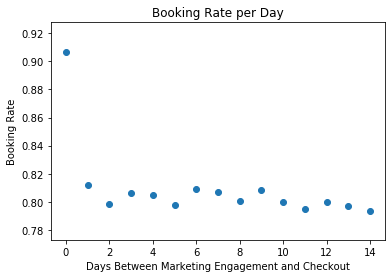

In [29]:
# Creating Scatter Plot of Daily Booking Rate for the first 2 weeks
import matplotlib.pyplot as plt
x= range(15)
y = (same_day_br,one_day_br,two_day_br,three_day_br,four_day_br,five_day_br,six_day_br,seven_day_br,eight_day_br,nine_day_br,ten_day_br,eleven_day_br,twelve_day_br,thirteen_day_br,fourteen_day_br)

q = zip(x,y)

plt.scatter(*zip(*q))
plt.title('Booking Rate per Day')
plt.xlabel('Days Between Marketing Engagement and Checkout')
plt.ylabel('Booking Rate')
plt.show()

In [30]:
# Seeing which marketing channels led the pack from the group of customers that purchased a loan on the same day the marketing engagement was made
same_day_booking_rate.last_touch_marketing_channel.value_counts()

Organic Search    926
Email             677
Push              430
Direct Load       404
Paid Social       285
Display            40
Name: last_touch_marketing_channel, dtype: int64

In [31]:
#Finding average number of applications per marketing channel (can also find per merchant)
industry_applications = final_merge.groupby(by=['last_touch_marketing_channel']).agg({'application': ['sum'],'approved': ['sum']})
industry_applications
# Reset the indexes
industry_applications.columns = industry_applications.columns.droplevel(level=1)
industry_applications.reset_index(inplace=True)
industry_applications['approval_rate'] = industry_applications.approved/industry_applications.application 
industry_applications


,last_touch_marketing_channel,application,approved,approval_rate
0,Direct Load,17783.0,16493.0,0.927459
1,Display,5141.0,4631.0,0.900798
2,Email,18770.0,17260.0,0.919552
3,Organic Search,23873.0,22119.0,0.926528
4,Paid Social,7605.0,7024.0,0.923603
5,Push,5238.0,5056.0,0.965254


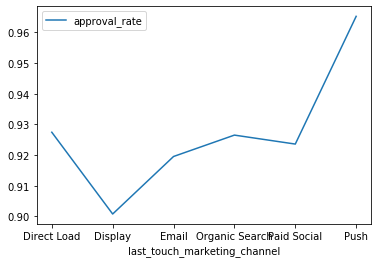

In [32]:
# Plot the approval rates and compare with the total number of applications
industry_applications.plot(x='last_touch_marketing_channel', y='approval_rate')
plt.show()



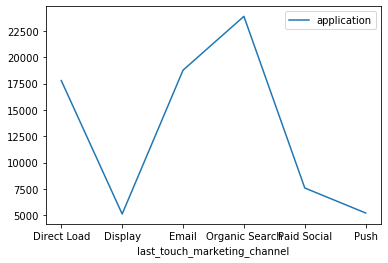

In [34]:
# Plotted the total number of applications per channel
industry_applications.plot(x='last_touch_marketing_channel', y='application')
plt.show()


In [37]:
# Use final_merge table to explore date+marketing channel
average_applitions_per_channel_per_day = final_merge.groupby(by=['total_days','last_touch_marketing_channel'],as_index=False).mean()
average_applitions_per_channel_per_day

,total_days,last_touch_marketing_channel,checkout_id_x,loan_amount,loan_length,loan_return,tos_x,checkout_id_y,application,approved,confirmed,tos_y
0,0,Direct Load,6.197144e+06,736.445545,8.814935,37.399838,3.017451e+07,1.792551e+07,2.896040,2.685644,2.450495,8.838327e+07
1,0,Display,6.496175e+06,478.175000,8.470588,28.263156,2.553300e+07,3.556162e+07,5.700000,4.800000,3.900000,1.817880e+08
2,0,Email,6.176822e+06,749.782866,8.639775,41.612068,3.198765e+07,1.533044e+07,2.490399,2.319055,2.093058,7.244709e+07
3,0,Organic Search,6.126714e+06,749.781857,8.869031,39.270864,2.853836e+07,1.552511e+07,2.547516,2.380130,2.178186,6.979041e+07
4,0,Paid Social,6.225623e+06,681.547368,9.095890,47.127436,3.040386e+07,1.569805e+07,2.501754,2.361404,2.136842,7.238014e+07
...,...,...,...,...,...,...,...,...,...,...,...,...
107,35,Direct Load,5.281272e+06,201.000000,3.000000,0.740091,2.100000e+06,1.438194e+07,3.000000,3.000000,3.000000,6.300000e+06
108,40,Email,5.281001e+06,175.500000,9.000000,-2.733583,2.100000e+06,9.258423e+06,2.000000,2.000000,2.000000,4.200000e+06
109,44,Email,5.314460e+06,309.000000,12.000000,-18.989534,2.100000e+06,9.328850e+06,2.000000,2.000000,2.000000,4.200000e+06
110,44,Organic Search,5.265173e+06,419.000000,12.000000,21.331709,2.100000e+06,9.116805e+06,2.000000,2.000000,2.000000,4.200000e+06


In [40]:
# Grabbing application rates to track with dates
marketing_effect = marketing_effect.merge(marketing_effect_rates, on='last_touch_marketing_channel')



In [41]:
# Cluster analysis of loan, merchant, and marketing
# Why? Learning a new representation of the data can sometimes improve the accuracy of supervised algorithms, or can lead to reduced memory and time consumption.

#in scaling, you're changing the range of your data, while in normalization, you're changing the shape of the distribution of your data (for each observation, we subtract the mean and then divide by the standard deviation of that variable)
# k-means is scaling dependent as it computes a distance between the two samples

marketing_loan_merchant = marketing_loan_merchant.loc[marketing_loan_merchant['loan_return'].isna() == False]


cluster = marketing_loan_merchant.drop(['user_id', 'checkout_id','merchant_id','name','date','checkout_date','tos'], axis=1)
cluster['loan_length'] = cluster['loan_length'].astype('str')
cluster.info()
data_dummies = pd.get_dummies(cluster)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 45409 entries, 0 to 50919
Data columns (total 6 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   last_touch_marketing_channel  45409 non-null  object 
 1   loan_amount                   45409 non-null  float64
 2   loan_length                   45409 non-null  object 
 3   fico_tranche                  45409 non-null  object 
 4   loan_return                   45409 non-null  float64
 5   industry                      45409 non-null  object 
dtypes: float64(2), object(4)
memory usage: 2.4+ MB


.63,  9518.58,  9547.54,  9576.49,
         9605.45,  9634.41,  9663.36,  9692.32,  9721.27,  9750.23,
         9779.19,  9808.14,  9837.1 ,  9866.05,  9895.01,  9923.97,
         9952.92,  9981.88, 10010.83, 10039.79, 10068.75, 10097.7 ,
        10126.66, 10155.61, 10184.57, 10213.53, 10242.48, 10271.44,
        10300.39, 10329.35, 10358.3 , 10387.26, 10416.22, 10445.17,
        10474.13, 10503.08, 10532.04, 10561.  , 10589.95, 10618.91,
        10647.86, 10676.82, 10705.78, 10734.73, 10763.69, 10792.64,
        10821.6 , 10850.56, 10879.51, 10908.47, 10937.42, 10966.38,
        10995.33, 11024.29, 11053.25, 11082.2 , 11111.16, 11140.11,
        11169.07, 11198.03, 11226.98, 11255.94, 11284.89, 11313.85,
        11342.81, 11371.76, 11400.72, 11429.67, 11458.63, 11487.59,
        11516.54, 11545.5 , 11574.45, 11603.41, 11632.36, 11661.32,
        11690.28, 11719.23, 11748.19, 11777.14, 11806.1 , 11835.06,
        11864.01, 11892.97, 11921.92, 11950.88, 11979.84, 12008.79,
        12037

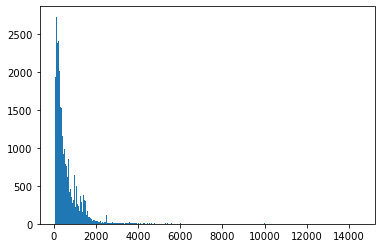

In [42]:
# Other bin

cluster.corr()
data_dummies.describe()
np.set_printoptions(precision=2)
bins = np.linspace(50, 15000, 4)
bins

plt.hist(data_dummies['loan_amount'], bins='auto')

C:\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


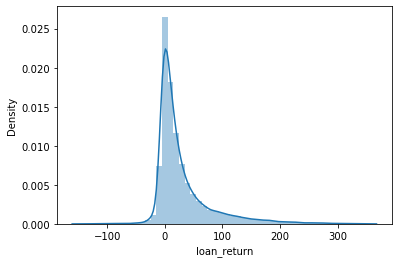

In [44]:
data_dummies.loan_amount.value_counts()
which_bin = np.digitize(data_dummies['loan_amount'],bins=bins)
(unique, counts) = numpy.unique(which_bin, return_counts=True)
filtered = data_dummies[(data_dummies['loan_return'] >= -150) & (data_dummies['loan_return'] < 350)]

sns.distplot(filtered['loan_return'], kde=True, hist=True)
plt.show()

In [45]:


df_labels = np.array(data_dummies['loan_return'])
x = np.array(data_dummies.drop('loan_return',axis=1))
feature_list = list(data_dummies.drop('loan_return',axis=1).columns)


X_train, X_test, y_train, y_test = train_test_split(
x, df_labels, random_state=1)


In [46]:
scaler2 = MinMaxScaler()
scaler = MinMaxScaler()

scaler.fit(X_train)
scaler2.fit(y_train.reshape(-1,1))
MinMaxScaler(copy=True, feature_range=(0, 1))

# don't print using scientific notation
np.set_printoptions(suppress=True, precision=2)
# transform data
X_train_scaled = scaler.transform(X_train)
# print data set properties before and after scaling
X_test_scaled = scaler.transform(X_test)
# transform data
y_train_scaled = scaler2.transform(y_train.reshape(-1,1))
# print data set properties before and after scaling
y_test_scaled = scaler2.transform(y_test.reshape(-1,1))


Text(0.5, 1.0, 'scaled data')

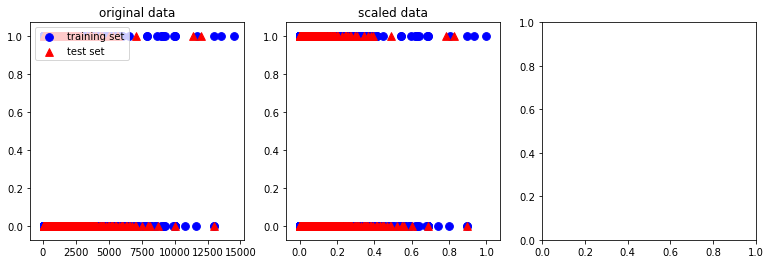

In [47]:

# plot the training and test set
fig, axes = plt.subplots(1, 3, figsize=(13, 4))
axes[0].scatter(X_train[:, 0], X_train[:, 1],
c='b', label="training set", s=60)
axes[0].scatter(X_test[:, 0], X_test[:, 1], marker='^',
c='r', label="test set", s=60)
axes[0].legend(loc='upper left')
axes[0].set_title("original data")

axes[1].scatter(X_train_scaled[:, 0], X_train_scaled[:, 1],
c='b', label="training set", s=60)
axes[1].scatter(X_test_scaled[:, 0], X_test_scaled[:, 1], marker='^',
c='r', label="test set", s=60)
axes[1].set_title("scaled data")


In [48]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

#from sklearn.datasets import make_regression
#X, y = make_regression(n_features=4, n_informative=2,
#...                        random_state=0, shuffle=False)
regr = RandomForestRegressor()

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

rf_random = RandomizedSearchCV(estimator = regr, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

rf_random.fit(X_train_scaled,y_train_scaled)

rf_random.best_params_
#regr.fit(X_train_scaled,y_train_scaled)
#regr.score(X_train_scaled,y_train_scaled)



Fitting 3 folds for each of 100 candidates, totalling 300 fits
C:\Anaconda\lib\site-packages\sklearn\model_selection\_search.py:880: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


{'n_estimators': 200,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': 'auto',
 'max_depth': 10,
 'bootstrap': True}

In [49]:
# Evaluating feature performances
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    
    return accuracy


best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, X_test_scaled, y_test_scaled)



Model Performance
Average Error: 0.0284 degrees.
Accuracy = 90.34%.


In [50]:
from sklearn.model_selection import GridSearchCV

n_estimators = [100, 200, 500, 800, 1200]
max_depth = [5, 8, 10, 15, 25, 30]
min_samples_split = [2, 5, 10, 15, 100]
min_samples_leaf = [1, 4, 5, 10] 

hyperF = dict(n_estimators = n_estimators, max_depth = max_depth,  
              min_samples_split = min_samples_split, 
             min_samples_leaf = min_samples_leaf)

gridF = GridSearchCV(regr, hyperF, cv = 3, verbose = 1, 
                      n_jobs = -1)
bestF = gridF.fit(X_train_scaled, y_train_scaled)

Fitting 3 folds for each of 600 candidates, totalling 1800 fits
C:\Anaconda\lib\site-packages\sklearn\model_selection\_search.py:880: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self.best_estimator_.fit(X, y, **fit_params)


In [51]:
# Evaluate Parameters

bestF.best_params_
bestF.best_estimator_

RandomForestRegressor(max_depth=10, min_samples_leaf=4, min_samples_split=100)

In [52]:
grid_accuracy = evaluate(bestF.best_estimator_, X_test_scaled,y_test_scaled)
grid_accuracy

Model Performance
Average Error: 0.0284 degrees.
Accuracy = 90.35%.


90.35487838717017

In [56]:
# Calculating root mean squares error 
y_pred = bestF.predict(X_test_scaled)
mse = mean_squared_error(y_test_scaled,y_pred)
rmse = np.sqrt(mse)
rmse

0.02168746434669761

In [62]:
# Finding channels leading to best booking and application rate per industry
marketing_rates_with_industry =  marketing_effect.groupby(['industry','last_touch_marketing_channel'], as_index=False).sum()
marketing_rates_with_industry['approval_rate'] = marketing_rates_with_industry.approved/marketing_rates_with_industry.application
marketing_rates_with_industry['booking_rate'] = marketing_rates_with_industry.confirmed/marketing_rates_with_industry.approved
marketing_rates_with_industry = marketing_rates_with_industry.groupby(['last_touch_marketing_channel','industry'], as_index=False).mean()[['last_touch_marketing_channel','industry','approval_rate','booking_rate']]
marketing_rates_with_industry


,last_touch_marketing_channel,industry,approval_rate,booking_rate
0,Direct Load,Apparel,0.000030,15703.062625
1,Direct Load,Furniture / Homewares,0.000030,15399.621741
2,Direct Load,Jewelry,0.000026,17580.877167
3,Direct Load,Sporting Goods and Outdoors,0.000022,21022.074499
4,Display,Apparel,0.000104,4429.718808
5,Display,Furniture / Homewares,0.000102,4509.180905
6,Display,Jewelry,0.000099,4618.749361
7,Display,Sporting Goods and Outdoors,0.000075,6086.000000
8,Email,Apparel,0.000026,17391.431338
9,Email,Furniture / Homewares,0.000026,17311.548913


In [ ]:
# Save df's for viz
average_repeats_by_industry.to_csv('average_repeats_by_industry.csv')
average_repeats_by_merchant.to_csv('average_repeats_by_merchant.csv')
industry.to_csv('industry.csv')
industry_rates.to_csv('industry_rates.csv')
total_marketing_effect.to_csv('total_marketing_effect.csv')
marketing_effect_rates.to_csv('marketing_effect_rates.csv')
marketing_profit_yield.to_csv('marketing_profit_yield.csv')
marketing_rates_with_industry.to_csv('marketing_rates_with_industry.csv')
name_rates.to_csv('name_rates.csv')
name_merchant.to_csv('name_merchant.csv')
profit_by_channel_by_industry.to_csv('profit_by_channel_by_industry.csv')



In [ ]:
# Creating correlation matrix
loan_amount_and_return_corr = cluster.corr()['loan_return']
loan_amount_and_return_corr
sns.pairplot(cluster, y_vars=['loan_return'],x_vars = cluster.loan_amount)